In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.feature_selection import mutual_info_regression
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.interpolate import griddata
from geopy.distance import geodesic


pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)

uae = pd.read_csv("dubai_properties.csv")

dubai = uae[uae['City'] == 'Dubai']

In [2]:
print("Dataset Shape:")
print(dubai.shape)

print("First 5 Rows:")
display(dubai.head())

print("5 Random Rows:")
display(dubai.sample(5))

print("Dataset Information:")
dubai.info()

print("Statistical Summary:")
display(dubai.describe())

Dataset Shape:
(34250, 17)
First 5 Rows:


,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
0,"Binghatti Heights, JVC District 10, Jumeirah Village Circle (JVC), Dubai",125000,2,2,Apartment,1145,109.170306,Medium,Yearly,Unfurnished,For Rent,2024-02-15,66,Jumeirah Village Circle (JVC),Dubai,25.055945,55.207465
1,"Seasons Community, JVC District 15, Jumeirah Village Circle (JVC), Dubai",50000,1,2,Apartment,655,76.335878,Low,Yearly,Unfurnished,For Rent,2024-03-21,31,Jumeirah Village Circle (JVC),Dubai,25.055945,55.207465
2,"Autumn 1 Block B, Autumn, Seasons Community, JVC District 15, Jumeirah Village Circle (JVC), Dubai",90000,1,2,Apartment,896,100.446429,Medium,Yearly,Furnished,For Rent,2024-04-08,13,Jumeirah Village Circle (JVC),Dubai,25.055945,55.207465
3,"Socio Tower A, Socio, Dubai Hills Estate, Dubai",125000,2,1,Apartment,720,173.611111,Medium,Yearly,Unfurnished,For Rent,2024-03-11,41,Dubai Hills Estate,Dubai,25.126891,55.263874
4,"Eleganz by Danube, JVC District 14, Jumeirah Village Circle (JVC), Dubai",105000,1,2,Apartment,965,108.808290,Medium,Yearly,Furnished,For Rent,2024-02-23,58,Jumeirah Village Circle (JVC),Dubai,25.055945,55.207465


5 Random Rows:


,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Frequency,Furnishing,Purpose,Posted_date,Age_of_listing_in_days,Location,City,Latitude,Longitude
4936,"Palace Residences, Dubai Creek Harbour, Dubai",150000,1,2,Apartment,708,211.864407,High,Yearly,Furnished,For Rent,2023-11-28,145,Dubai Creek Harbour,Dubai,25.197978,55.360380
20773,"Socio Tower B, Socio, Dubai Hills Estate, Dubai",85000,1,2,Apartment,485,175.257732,Medium,Yearly,Unfurnished,For Rent,2024-02-20,61,Dubai Hills Estate,Dubai,25.098721,55.253940
12756,"The Nook 2, The Nook, Wasl Gate, Dubai",85000,2,2,Apartment,727,116.918845,Medium,Yearly,Furnished,For Rent,2024-04-02,19,Wasl Gate,Dubai,25.025804,55.107554
30533,"Al Barari, Dubai",2600000,6,2,Villa,13324,195.136596,High,Yearly,Unfurnished,For Rent,2024-01-31,81,Al Barari,Dubai,25.118865,55.320968
8319,"Burj Views Podium, Burj Views, Downtown Dubai, Dubai",90000,0,2,Apartment,734,122.615804,Medium,Yearly,Furnished,For Rent,2024-04-02,19,Downtown Dubai,Dubai,25.186684,55.274705


Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34250 entries, 0 to 34249
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Address                 34250 non-null  object 
 1   Rent                    34250 non-null  int64  
 2   Beds                    34250 non-null  int64  
 3   Baths                   34250 non-null  int64  
 4   Type                    34250 non-null  object 
 5   Area_in_sqft            34250 non-null  int64  
 6   Rent_per_sqft           34250 non-null  float64
 7   Rent_category           34250 non-null  object 
 8   Frequency               34250 non-null  object 
 9   Furnishing              34250 non-null  object 
 10  Purpose                 34250 non-null  object 
 11  Posted_date             34250 non-null  object 
 12  Age_of_listing_in_days  34250 non-null  int64  
 13  Location                34250 non-null  object 
 14  City             

,Rent,Beds,Baths,Area_in_sqft,Rent_per_sqft,Age_of_listing_in_days,Latitude,Longitude
count,3.425000e+04,34250.000000,34250.000000,34250.000000,34250.000000,34250.000000,34219.000000,34219.000000
mean,2.133664e+05,1.971212,2.081518,1831.808321,132.253717,63.912263,25.115468,55.243369
std,4.272489e+05,1.395483,0.561300,3119.024048,70.329882,55.176208,0.072895,0.079851
min,0.000000e+00,0.000000,1.000000,74.000000,0.000000,12.000000,24.839901,54.998449
25%,8.500000e+04,1.000000,2.000000,754.000000,86.614173,27.000000,25.058657,55.170057
50%,1.450000e+05,2.000000,2.000000,1163.000000,120.000000,46.000000,25.098721,55.263874
75%,2.300000e+05,3.000000,2.000000,1930.750000,159.997167,81.000000,25.186684,55.288876
max,5.500000e+07,12.000000,11.000000,210254.000000,2182.044888,1131.000000,25.300533,55.569534


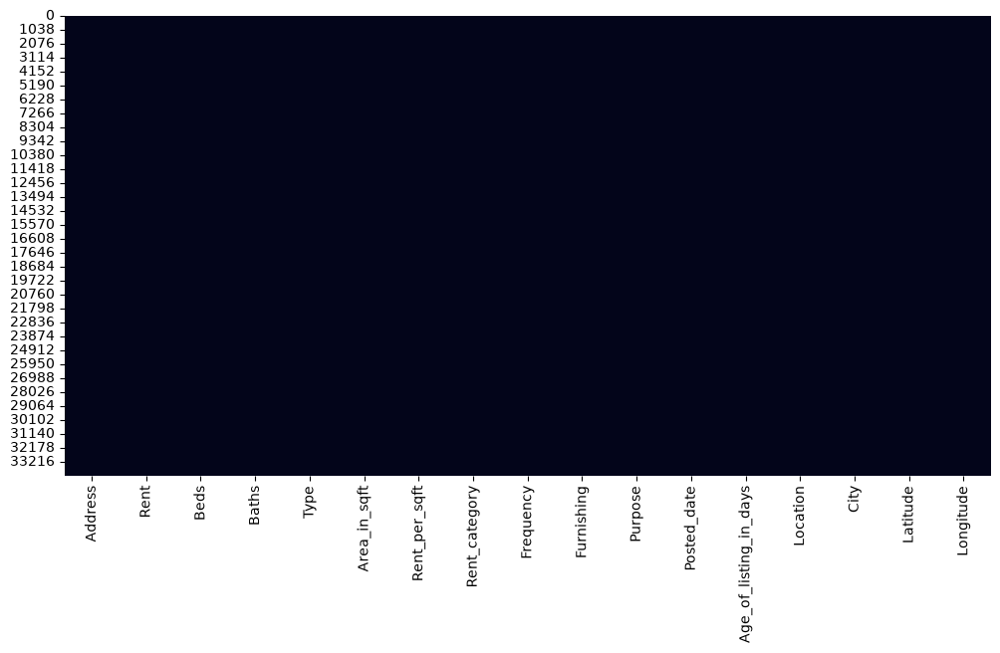

,Missing Count,Missing Percentage
Longitude,31,0.090511
Latitude,31,0.090511
Address,0,0.000000
Rent,0,0.000000
Beds,0,0.000000
Area_in_sqft,0,0.000000
Rent_per_sqft,0,0.000000
Baths,0,0.000000
Type,0,0.000000
Frequency,0,0.000000


In [3]:
missing = pd.DataFrame({
    "Missing Count": dubai.isnull().sum(),
    "Missing Percentage": (dubai.isnull().sum() / len(dubai)) * 100
})

missing = missing.sort_values(
    by="Missing Percentage",
    ascending=False
)
plt.figure(figsize=(12,6))
sns.heatmap(dubai.isnull(), cbar=False)
plt.show()
display(missing)

In [4]:
dubai = dubai.dropna(subset=['Latitude', 'Longitude'])
print("Missing Values Summary:")
print(dubai.isnull().sum())

Missing Values Summary:
Address                   0
Rent                      0
Beds                      0
Baths                     0
Type                      0
Area_in_sqft              0
Rent_per_sqft             0
Rent_category             0
Frequency                 0
Furnishing                0
Purpose                   0
Posted_date               0
Age_of_listing_in_days    0
Location                  0
City                      0
Latitude                  0
Longitude                 0
dtype: int64


In [5]:
duplicate_columns = [
    'Longitude',
    'Latitude',
    'Location',
    'Furnishing',
    'Rent_category',
    'Rent_per_sqft',
    'Area_in_sqft',
    'Type',
    'Baths',
    'Beds',
    'Address',
    'Rent'
]

duplicate_mask = dubai.duplicated(
    subset=duplicate_columns,
    keep=False
)

print("Partiall Duplicate Analysis Report:")

print(f"Total Rows: {len(dubai):,}")

duplicates = dubai.duplicated().sum()

print(f"Duplicated rows: {duplicates}")

print(f"Partial Duplicate Rows: {duplicate_mask.sum():,}")
print(
    f"Partial Duplicate Groups: "
    f"{dubai[duplicate_mask].groupby(duplicate_columns).ngroups:,}"
)
print(
    f"Partial Duplicate Percentage: "
    f"{duplicate_mask.mean() * 100:.2f}%"
)
print(
    f"Rows After Deduplication: "
    f"{len(dubai.drop_duplicates(subset=duplicate_columns)):,}"
)

Partiall Duplicate Analysis Report:
Total Rows: 34,219
Duplicated rows: 0
Partial Duplicate Rows: 6,462
Partial Duplicate Groups: 2,587
Partial Duplicate Percentage: 18.88%
Rows After Deduplication: 30,344


In [6]:
rows_before = len(dubai)

dubai = (
    dubai
    .sort_values('Age_of_listing_in_days', ascending=True)
    .drop_duplicates(
        subset=duplicate_columns,
        keep='first'
    )
    .reset_index(drop=True)
)

rows_after = len(dubai)

print(f"Removed Rows: {rows_before - rows_after:,}")
print(f"Remaining Rows: {rows_after:,}")

Removed Rows: 3,875
Remaining Rows: 30,344


In [7]:
dubai['Posted_date'] = pd.to_datetime(dubai['Posted_date'], errors='coerce')

num_cols = [
    'Rent',
    'Beds',
    'Baths',
    'Area_in_sqft',
    'Rent_per_sqft',
    'Age_of_listing_in_days',
    'Latitude',
    'Longitude'
]

dubai[num_cols] = dubai[num_cols].apply(pd.to_numeric, errors='coerce')
dubai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30344 entries, 0 to 30343
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Address                 30344 non-null  object        
 1   Rent                    30344 non-null  int64         
 2   Beds                    30344 non-null  int64         
 3   Baths                   30344 non-null  int64         
 4   Type                    30344 non-null  object        
 5   Area_in_sqft            30344 non-null  int64         
 6   Rent_per_sqft           30344 non-null  float64       
 7   Rent_category           30344 non-null  object        
 8   Frequency               30344 non-null  object        
 9   Furnishing              30344 non-null  object        
 10  Purpose                 30344 non-null  object        
 11  Posted_date             30344 non-null  datetime64[ns]
 12  Age_of_listing_in_days  30344 non-null  int64 

### Data Type Standardization

The dataset columns were standardized by converting `Posted_date` into a proper datetime format and ensuring all numerical features were correctly cast to numeric types. This step improves data consistency and prepares the dataset for accurate analysis and modeling.

In [8]:
text_cols = dubai.select_dtypes(include='object').columns

for col in text_cols:
    dubai[col] = dubai[col].astype(str).str.strip().str.lower()

### Text Data Cleaning

All categorical text columns were standardized by removing leading/trailing spaces and converting all values to lowercase. This ensures consistency in categorical features and prevents duplicate categories caused by formatting differences.

In [9]:
summary = []

for col in text_cols:
    summary.append({
        "Column": col,
        "Unique": dubai[col].nunique(),
        "Most Frequent": dubai[col].mode()[0],
        "Frequency": dubai[col].value_counts().iloc[0]
    })

summary_df = pd.DataFrame(summary)
summary_df.sort_values("Unique", ascending=False)

,Column,Unique,Most Frequent,Frequency
0,Address,3045,"binghatti heights, jvc district 10, jumeirah village circle (jvc), dubai",199
6,Location,119,jumeirah village circle (jvc),2718
1,Type,9,apartment,22883
2,Rent_category,3,high,15362
4,Furnishing,2,unfurnished,18636
3,Frequency,1,yearly,30344
5,Purpose,1,for rent,30344
7,City,1,dubai,30344


In [10]:
dubai['Type'].value_counts()

Type
apartment               22883
villa                    4706
townhouse                2153
hotel apartment           417
penthouse                 145
villa compound             17
residential building       11
residential floor          10
residential plot            2
Name: count, dtype: int64

In [11]:
for col in text_cols:
    print(f"Top 5 Most Frequent Values in '{col}':")

    top_5 = dubai[col].value_counts().head(5)

    result = pd.DataFrame({
        'Rank': range(1, len(top_5) + 1),
        'Value': top_5.index,
        'Count': top_5.values
    })

    result['Percentage (%)'] = (
        (result['Count'] / len(dubai) * 100)
    ).round(2)

    display(result)

Top 5 Most Frequent Values in 'Address':


,Rank,Value,Count,Percentage (%)
0,1,"binghatti heights, jvc district 10, jumeirah village circle (jvc), dubai",199,0.66
1,2,"palace residences, dubai creek harbour, dubai",190,0.63
2,3,"cherrywoods, dubailand, dubai",177,0.58
3,4,"expo golf villas 2 (parkside 2), expo golf villas, emaar south, dubai south, dubai",173,0.57
4,5,"forte 1, forte, downtown dubai, dubai",172,0.57


Top 5 Most Frequent Values in 'Type':


,Rank,Value,Count,Percentage (%)
0,1,apartment,22883,75.41
1,2,villa,4706,15.51
2,3,townhouse,2153,7.10
3,4,hotel apartment,417,1.37
4,5,penthouse,145,0.48


Top 5 Most Frequent Values in 'Rent_category':


,Rank,Value,Count,Percentage (%)
0,1,high,15362,50.63
1,2,medium,10570,34.83
2,3,low,4412,14.54


Top 5 Most Frequent Values in 'Frequency':


,Rank,Value,Count,Percentage (%)
0,1,yearly,30344,100.0


Top 5 Most Frequent Values in 'Furnishing':


,Rank,Value,Count,Percentage (%)
0,1,unfurnished,18636,61.42
1,2,furnished,11708,38.58


Top 5 Most Frequent Values in 'Purpose':


,Rank,Value,Count,Percentage (%)
0,1,for rent,30344,100.0


Top 5 Most Frequent Values in 'Location':


,Rank,Value,Count,Percentage (%)
0,1,jumeirah village circle (jvc),2718,8.96
1,2,downtown dubai,2549,8.40
2,3,dubai marina,2185,7.20
3,4,business bay,1851,6.10
4,5,dubai creek harbour,1478,4.87


Top 5 Most Frequent Values in 'City':


,Rank,Value,Count,Percentage (%)
0,1,dubai,30344,100.0


In [12]:
dubai.drop(columns=['Frequency', 'Purpose', 'City'], inplace=True)

# Feature Removal

Non-informative features (`Frequency`, `Purpose`, and `City`) were removed because they contained only a single unique value and therefore provided no predictive value. 

In [13]:
print("Number of zero or negative values:")

for col in [
    'Rent',
    'Area_in_sqft',
    'Rent_per_sqft',
    'Age_of_listing_in_days'
]:
    print(f"{col:<25}: {(dubai[col] <= 0).sum()}")
print("\nNumber of negative values:")
print("Beds:", (dubai['Beds'] < 0).sum())
print("Baths:", (dubai['Baths'] < 0).sum())

Number of zero or negative values:
Rent                     : 14
Area_in_sqft             : 0
Rent_per_sqft            : 14
Age_of_listing_in_days   : 0

Number of negative values:
Beds: 0
Baths: 0


In [14]:
dubai = dubai[dubai['Rent'] > 0]
print(f"Number of records with Rent = 0: {(dubai['Rent'] == 0).sum()}")
print(f"Number of records with Rent_per_sqft = 0: {(dubai['Rent_per_sqft'] == 0).sum()}")

Number of records with Rent = 0: 0
Number of records with Rent_per_sqft = 0: 0


# Removing Invalid Rental Records

Rows with a rental price equal to zero were removed, as a rent value of zero is not valid for rental property listings and may negatively impact data quality and model performance.

In [15]:
display(dubai.head())
display(dubai.describe())

,Address,Rent,Beds,Baths,Type,Area_in_sqft,Rent_per_sqft,Rent_category,Furnishing,Posted_date,Age_of_listing_in_days,Location,Latitude,Longitude
0,"sofitel downtown, sheikh zayed road, dubai",375000,2,2,hotel apartment,1614,232.342007,high,furnished,2024-04-09,12,sheikh zayed road,25.217623,55.278283
1,"creek gate tower 2, creek gate, dubai creek harbour, dubai",140000,2,2,apartment,1014,138.067061,medium,furnished,2024-04-09,12,dubai creek harbour,25.197978,55.360380
2,"marina vista, emaar beachfront, dubai harbour, dubai",179999,1,2,apartment,739,243.571042,high,unfurnished,2024-04-09,12,dubai harbour,25.095619,55.138001
3,"maple, dubai hills estate, dubai",300000,5,2,villa,3010,99.667774,high,unfurnished,2024-04-09,12,dubai hills estate,25.126891,55.263874
4,"basswood, damac hills 2 (akoya by damac), dubai",105000,3,2,apartment,2271,46.235139,medium,unfurnished,2024-04-09,12,damac hills 2 (akoya by damac),24.987364,55.373964


,Rent,Beds,Baths,Area_in_sqft,Rent_per_sqft,Posted_date,Age_of_listing_in_days,Latitude,Longitude
count,3.033000e+04,30330.000000,30330.000000,30330.000000,30330.000000,30330,30330.000000,30330.000000,30330.000000
mean,2.168885e+05,1.987174,2.089581,1871.454929,131.575831,2024-02-18 03:07:49.317507328,62.869568,25.114972,55.244050
min,2.900000e+02,0.000000,1.000000,74.000000,0.232000,2021-03-17 00:00:00,12.000000,24.839901,54.998449
25%,8.500000e+04,1.000000,2.000000,755.000000,85.345905,2024-01-31 00:00:00,26.000000,25.058657,55.172148
50%,1.450000e+05,2.000000,2.000000,1171.000000,119.047619,2024-03-07 00:00:00,45.000000,25.098721,55.263874
75%,2.350000e+05,3.000000,2.000000,1949.000000,159.189580,2024-03-26 00:00:00,81.000000,25.186684,55.288876
max,5.500000e+07,12.000000,11.000000,210254.000000,2182.044888,2024-04-09 00:00:00,1131.000000,25.300533,55.569534
std,4.488698e+05,1.413724,0.589891,3255.860017,71.334678,NaN,55.095534,0.073381,0.080301


C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\3027390652.py:21: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\3027390652.py:21: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\3027390652.py:21: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\3027390652.py:21: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed 

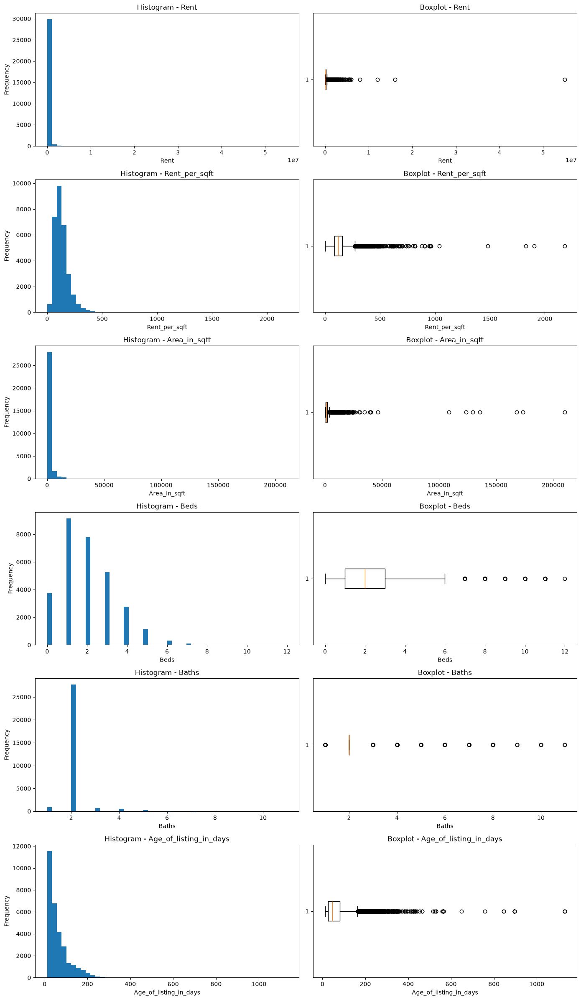

In [16]:
num_cols = [
    'Rent',
    'Rent_per_sqft',
    'Area_in_sqft',
    'Beds',
    'Baths',
    'Age_of_listing_in_days'
]

fig, axes = plt.subplots(len(num_cols), 2, figsize=(14, 4 * len(num_cols)))

for i, col in enumerate(num_cols):
    
    # Histogram
    axes[i, 0].hist(dubai[col].dropna(), bins=50)
    axes[i, 0].set_title(f'Histogram - {col}')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")

    # Boxplot
    axes[i, 1].boxplot(dubai[col].dropna(), vert=False)
    axes[i, 1].set_title(f'Boxplot - {col}')
    axes[i, 1].set_xlabel(col)

plt.tight_layout()
plt.show()

In [17]:
for col in num_cols:
    Q1 = dubai[col].quantile(0.25)
    Q3 = dubai[col].quantile(0.75)
    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    outliers = ((dubai[col] < lower) | (dubai[col] > upper)).sum()

    print(f"{col}:")
    print(f"Outliers: {outliers}")
    print(f"Percentage of Outliers: {outliers/len(dubai)*100:.2f}%")
    print(f"")

Rent:
Outliers: 1980
Percentage of Outliers: 6.53%

Rent_per_sqft:
Outliers: 1183
Percentage of Outliers: 3.90%

Area_in_sqft:
Outliers: 2803
Percentage of Outliers: 9.24%

Beds:
Outliers: 134
Percentage of Outliers: 0.44%

Baths:
Outliers: 2653
Percentage of Outliers: 8.75%

Age_of_listing_in_days:
Outliers: 1854
Percentage of Outliers: 6.11%



In [18]:
rent_limit = 1e7
rent_per_sqft_limit = 1000
area_limit = 100000
age_limit = 600

mask_outliers = (
    (dubai['Rent'] > rent_limit) |
    (dubai['Rent_per_sqft'] > rent_per_sqft_limit) |
    (dubai['Area_in_sqft'] > area_limit) |
    (dubai['Age_of_listing_in_days'] > age_limit)
)

outliers = dubai[mask_outliers]

num_deleted = outliers.shape[0]

dubai_clean = dubai[~mask_outliers].reset_index(drop=True)


print("Number of deleted rows:", num_deleted)
print("Remaining rows:", dubai_clean.shape[0])

Number of deleted rows: 29
Remaining rows: 30301


C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\998673295.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai_clean[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\998673295.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai_clean[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\998673295.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and will be removed in 3.13. Use orientation: {'vertical', 'horizontal'} instead.
  axes[i, 1].boxplot(dubai_clean[col].dropna(), vert=False)
C:\Users\mhdma\AppData\Local\Temp\ipykernel_14516\998673295.py:12: MatplotlibDeprecationWarning: vert: bool was deprecated in Matplotlib 3.11 and wi

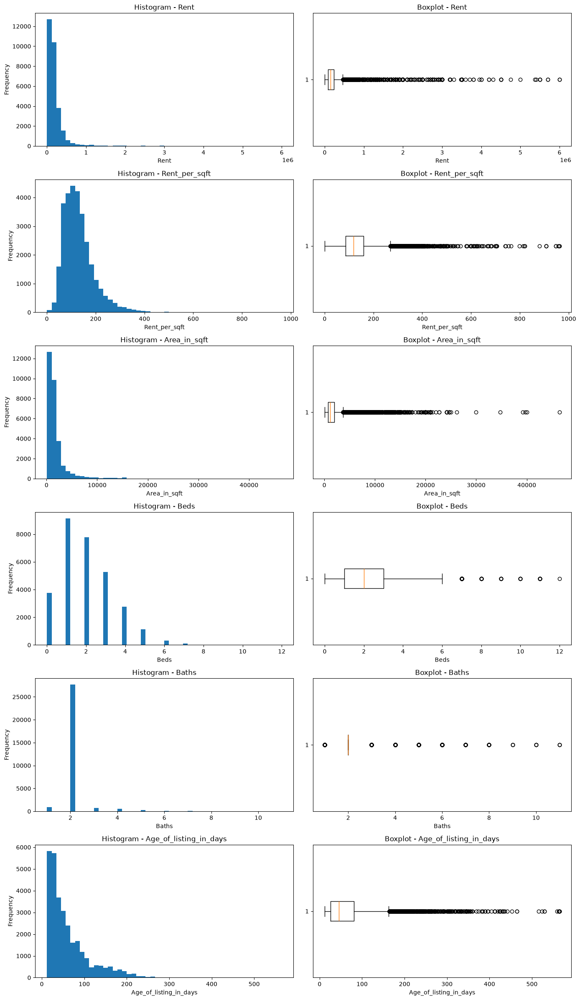

In [19]:
fig, axes = plt.subplots(len(num_cols), 2, figsize=(14, 4 * len(num_cols)))

for i, col in enumerate(num_cols):
    
    # Histogram
    axes[i, 0].hist(dubai_clean[col].dropna(), bins=50)
    axes[i, 0].set_title(f'Histogram - {col}')
    axes[i, 0].set_xlabel(col)
    axes[i, 0].set_ylabel("Frequency")

    # Boxplot
    axes[i, 1].boxplot(dubai_clean[col].dropna(), vert=False)
    axes[i, 1].set_title(f'Boxplot - {col}')
    axes[i, 1].set_xlabel(col)

plt.tight_layout()
plt.show()

# Outlier Detection and Data Cleaning Strategy

Exploratory Data Analysis (EDA) was conducted to identify outliers using histograms and boxplots, in addition to the IQR method. Since real estate data is typically right-skewed and may include legitimate luxury property values, not all detected outliers were removed. Instead, a more careful approach was applied using domain knowledge to distinguish between valid extreme values and potential data entry errors. Only records identified as erroneous were removed to preserve the integrity and informational value of the dataset.

In [20]:
target = "Rent_per_sqft"
dubai_clean = dubai_clean.drop(columns=["Rent"])
X = dubai_clean.drop(columns=[target])
y = dubai_clean[target]

num_cols = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
text_cols = X.select_dtypes(include=["object"]).columns.tolist()

print("Numeric Coloumns:", num_cols)
print("Categorical Coloumns:", text_cols)
print("The Target:", target)

Numeric Coloumns: ['Beds', 'Baths', 'Area_in_sqft', 'Age_of_listing_in_days', 'Latitude', 'Longitude']
Categorical Coloumns: ['Address', 'Type', 'Rent_category', 'Furnishing', 'Location']
The Target: Rent_per_sqft


In [21]:
summary = pd.DataFrame(index=num_cols)

summary["dtype"] = X[num_cols].dtypes.astype(str)
summary["missing"] = X[num_cols].isna().sum()
summary["missing_%"] = (X[num_cols].isna().mean() * 100).round(2)

summary["unique"] = X[num_cols].nunique()

summary["mean"] = X[num_cols].mean()
summary["median"] = X[num_cols].median()
summary["std"] = X[num_cols].std()

summary["min"] = X[num_cols].min()
summary["25%"] = X[num_cols].quantile(0.25)
summary["50%"] = X[num_cols].quantile(0.50)
summary["75%"] = X[num_cols].quantile(0.75)
summary["max"] = X[num_cols].max()

summary["skew"] = X[num_cols].skew()
summary["kurtosis"] = X[num_cols].kurtosis()

summary = summary.round(3)

summary

,dtype,missing,missing_%,unique,mean,median,std,min,25%,50%,75%,max,skew,kurtosis
Beds,int64,0,0.0,13,1.986,2.000,1.410,0.000,1.000,2.000,3.000,12.000,0.812,0.981
Baths,int64,0,0.0,11,2.090,2.000,0.590,1.000,2.000,2.000,2.000,11.000,5.216,38.978
Area_in_sqft,int64,0,0.0,4039,1836.030,1171.000,2291.813,74.000,754.000,1171.000,1948.000,46474.000,4.664,34.029
Age_of_listing_in_days,int64,0,0.0,340,62.460,45.000,51.708,12.000,26.000,45.000,81.000,565.000,2.110,7.183
Latitude,float64,0,0.0,138,25.115,25.099,0.073,24.840,25.057,25.099,25.187,25.301,-0.112,-0.356
Longitude,float64,0,0.0,138,55.244,55.264,0.080,54.998,55.172,55.264,55.289,55.570,0.277,-0.243


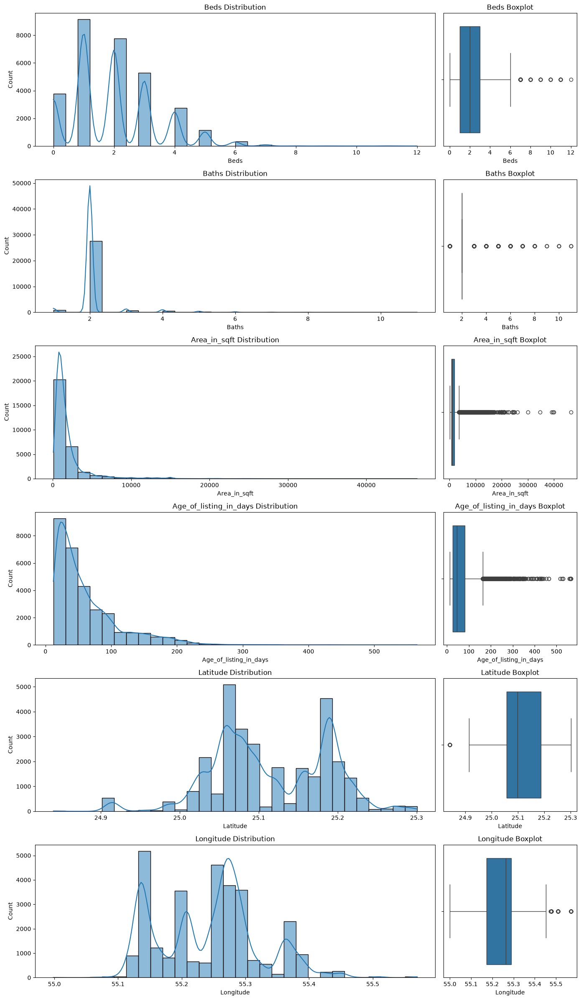

In [22]:
num_lenght = len(num_cols)

fig, axes = plt.subplots(
    nrows=num_lenght,
    ncols=2,
    figsize=(14, 4 * num_lenght),
    gridspec_kw={"width_ratios": [3, 1]}
)

for i, feature in enumerate(num_cols):

    # Histogram + KDE
    sns.histplot(
        X[feature],
        kde=True,
        bins=30,
        ax=axes[i, 0]
    )
    axes[i, 0].set_title(f"{feature} Distribution")
    axes[i, 0].set_xlabel(feature)

    # Boxplot
    sns.boxplot(
        x=X[feature],
        ax=axes[i, 1]
    )
    axes[i, 1].set_title(f"{feature} Boxplot")

plt.tight_layout()
plt.show()

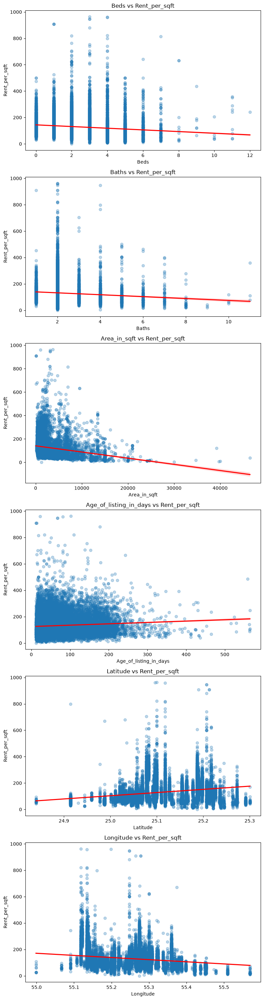

In [23]:
fig, axes = plt.subplots(
    nrows=num_lenght,
    ncols=1,
    figsize=(8, 5 * num_lenght)
)

for i, feature in enumerate(num_cols):

    sns.regplot(
        x=X[feature],
        y=y,
        scatter_kws={"alpha": 0.3},
        line_kws={"color": "red"},
        ax=axes[i]
    )

    axes[i].set_title(f"{feature} vs {target}")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel(target)

plt.tight_layout()
plt.show()

In [24]:
mi = mutual_info_regression(X[num_cols], y, random_state=100)

mi_scores = pd.Series(mi, index=num_cols).sort_values(ascending=False)

print("Feature importance ranking based on Mutual Information with the target variable:")
print(mi_scores)

Feature importance ranking based on Mutual Information with the target variable:
Area_in_sqft              1.234888
Longitude                 0.731953
Latitude                  0.725352
Beds                      0.233391
Age_of_listing_in_days    0.026083
Baths                     0.009352
dtype: float64


Correlation coefficients between numerical features and Rent_per_sqft:
Latitude                  0.260725
Age_of_listing_in_days    0.078139
Baths                    -0.062278
Beds                     -0.131527
Area_in_sqft             -0.177254
Longitude                -0.189750
dtype: float64


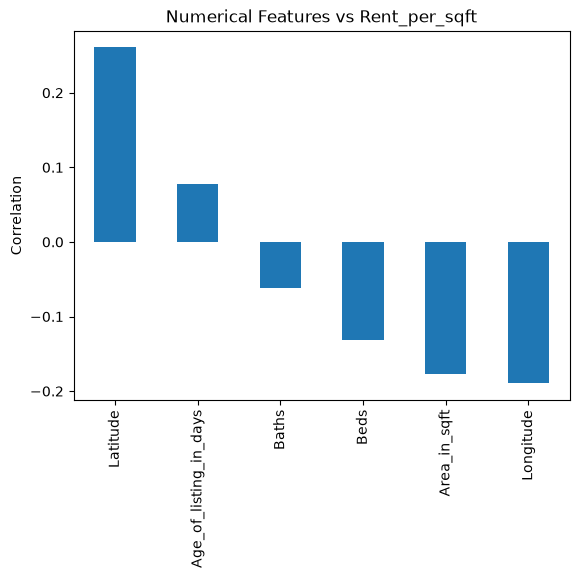

In [25]:
corr = pd.Series({
    col: dubai_clean[col].corr(dubai_clean[target])
    for col in num_cols
}).sort_values(ascending=False)

print("Correlation coefficients between numerical features and Rent_per_sqft:")
print(corr)

corr.plot(kind="bar")
plt.title("Numerical Features vs Rent_per_sqft")
plt.ylabel("Correlation")
plt.show()

In [26]:
cardinality = pd.DataFrame({
    "Feature": text_cols,
    "Unique Values": [X[col].nunique() for col in text_cols]
}).sort_values("Unique Values", ascending=False)

display(cardinality)

,Feature,Unique Values
0,Address,3038
4,Location,119
1,Type,9
2,Rent_category,3
3,Furnishing,2


In [27]:
for col in text_cols:
    print("_" * 80)
    print(col)

    freq = (
        X[col]
        .value_counts(normalize=True)
        .mul(100)
        .round(2)
        .rename("Percentage")
    )

    display(freq)

    rare = freq[freq < 1]

    if len(rare):
        print("\nRare Categories (<1%):")
        display(rare)

________________________________________________________________________________
Address


Address
binghatti heights, jvc district 10, jumeirah village circle (jvc), dubai              0.66
palace residences, dubai creek harbour, dubai                                         0.63
cherrywoods, dubailand, dubai                                                         0.58
expo golf villas 2 (parkside 2), expo golf villas, emaar south, dubai south, dubai    0.57
forte 1, forte, downtown dubai, dubai                                                 0.56
                                                                                      ... 
the place, dubai investment park (dip), dubai                                         0.00
caesars resort, bluewaters island, dubai                                              0.00
nasir building, dubai production city (impz), dubai                                   0.00
indigo central 7, al manara, dubai                                                    0.00
la residence, jvt district 1, jumeirah village triangle (jvt), dubai              


Rare Categories (<1%):


Address
binghatti heights, jvc district 10, jumeirah village circle (jvc), dubai              0.66
palace residences, dubai creek harbour, dubai                                         0.63
cherrywoods, dubailand, dubai                                                         0.58
expo golf villas 2 (parkside 2), expo golf villas, emaar south, dubai south, dubai    0.57
forte 1, forte, downtown dubai, dubai                                                 0.56
                                                                                      ... 
the place, dubai investment park (dip), dubai                                         0.00
caesars resort, bluewaters island, dubai                                              0.00
nasir building, dubai production city (impz), dubai                                   0.00
indigo central 7, al manara, dubai                                                    0.00
la residence, jvt district 1, jumeirah village triangle (jvt), dubai              

________________________________________________________________________________
Type


Type
apartment               75.43
villa                   15.50
townhouse                7.11
hotel apartment          1.38
penthouse                0.48
villa compound           0.05
residential floor        0.03
residential building     0.03
residential plot         0.00
Name: Percentage, dtype: float64


Rare Categories (<1%):


Type
penthouse               0.48
villa compound          0.05
residential floor       0.03
residential building    0.03
residential plot        0.00
Name: Percentage, dtype: float64

________________________________________________________________________________
Rent_category


Rent_category
high      50.64
medium    34.88
low       14.48
Name: Percentage, dtype: float64

________________________________________________________________________________
Furnishing


Furnishing
unfurnished    61.4
furnished      38.6
Name: Percentage, dtype: float64

________________________________________________________________________________
Location


Location
jumeirah village circle (jvc)    8.97
downtown dubai                   8.40
dubai marina                     7.21
business bay                     6.11
dubai creek harbour              4.87
                                 ... 
umm ramool                       0.00
al hebiah 2                      0.00
oud al muteena                   0.00
knowledge village                0.00
al lisaili                       0.00
Name: Percentage, Length: 119, dtype: float64


Rare Categories (<1%):


Location
al jaddaf             0.97
international city    0.94
the springs           0.85
jumeirah park         0.76
reem                  0.73
                      ... 
umm ramool            0.00
al hebiah 2           0.00
oud al muteena        0.00
knowledge village     0.00
al lisaili            0.00
Name: Percentage, Length: 92, dtype: float64

In [28]:
X["Type"] = X["Type"].replace({
    "villa compound": "villa",
    "residential floor": "Other",
    "residential building": "Other",
    "residential plot": "Other"
})
X["Type"].value_counts(normalize=True) * 100

Type
apartment          75.426554
villa              15.553942
townhouse           7.105376
hotel apartment     1.376192
penthouse           0.475232
Other               0.062704
Name: proportion, dtype: float64

### Type Feature Consolidation

Rare property types were grouped into broader categories to reduce category fragmentation and improve model stability. Similar property types were merged, while low-frequency categories were combined into an "Other" class.

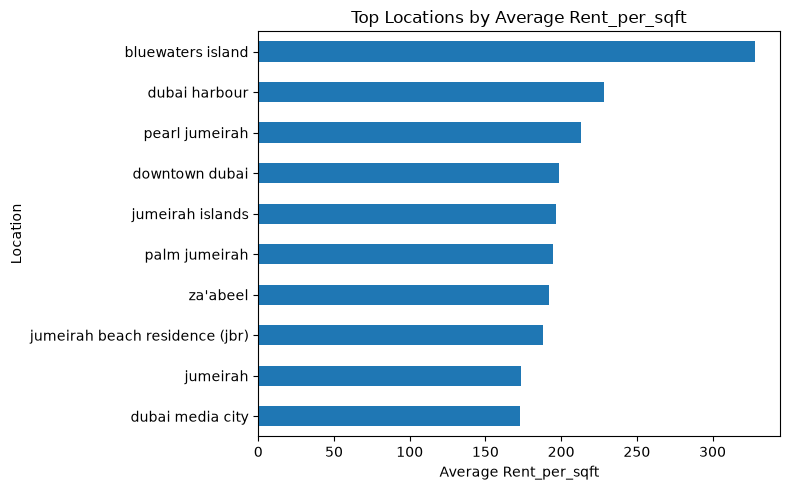

In [29]:
location_mean = (
    pd.concat([X["Location"], y], axis=1)
      .groupby("Location")[target]
      .mean()
      .sort_values(ascending=False)
)

location_mean.head(10).sort_values().plot(
    kind="barh",
    figsize=(8, 5)
)

plt.title("Top Locations by Average Rent_per_sqft")
plt.xlabel("Average Rent_per_sqft")
plt.ylabel("Location")
plt.tight_layout()
plt.show()

,count,mean,median
Address,,,
"bvlgari resort and residences, jumeirah bay islands, jumeirah, dubai",1,741.289844,741.289844
"bulgari residence 6, bulgari residences, jumeirah bay islands, jumeirah, dubai",3,734.418110,698.757764
"the royal atlantis resort & residences, the crescent, palm jumeirah, dubai",14,655.237073,703.103711
"bulgari residences, jumeirah bay islands, jumeirah, dubai",8,644.275111,611.970833
"signature villas frond g, signature villas palm jumeirah, palm jumeirah, dubai",2,631.412830,631.412830
"one at palm jumeirah, palm jumeirah, dubai",9,563.891976,534.269577
"bulgari residence 1, bulgari residences, jumeirah bay islands, jumeirah, dubai",2,559.443203,559.443203
"bulgari residence 5, bulgari residences, jumeirah bay islands, jumeirah, dubai",3,554.301684,598.659004
"bulgari residence 2, bulgari residences, jumeirah bay islands, jumeirah, dubai",2,534.246851,534.246851


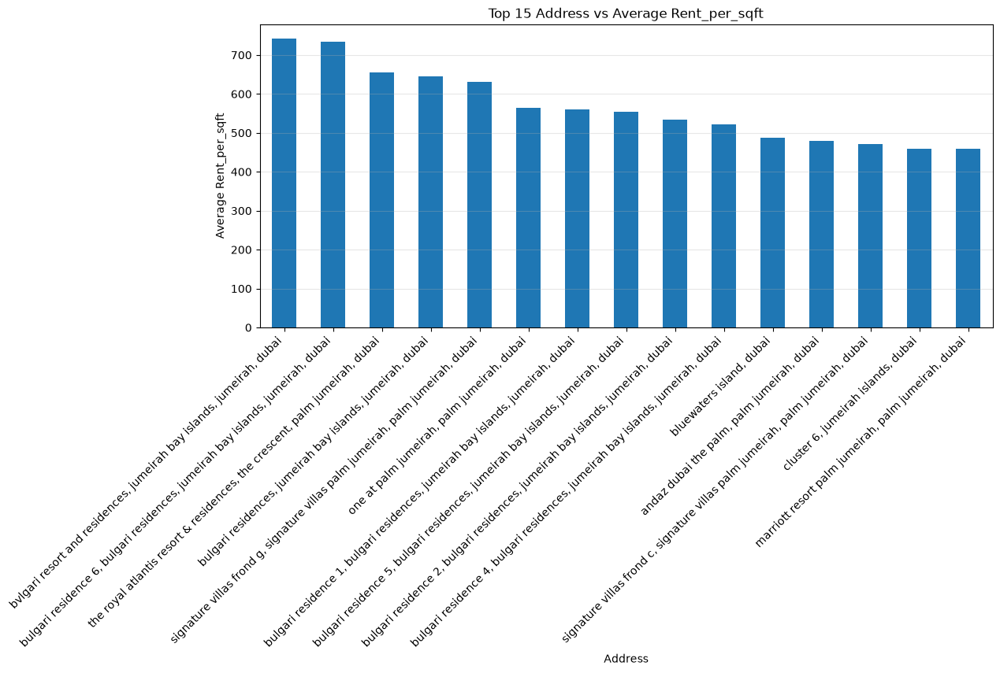

,count,mean,median
Type,,,
hotel apartment,417,201.340845,179.245283
Other,19,191.390801,165.000000
penthouse,144,161.914301,125.319286
apartment,22855,141.978711,129.921260
villa,4713,93.331647,79.872204
townhouse,2153,85.368096,77.086656


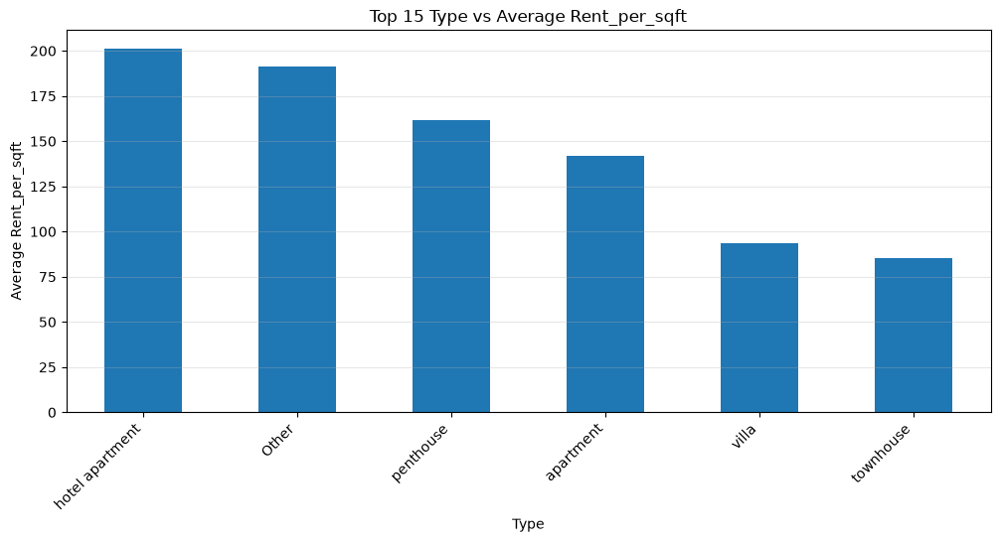

,count,mean,median
Rent_category,,,
high,15345,148.320510,131.909938
medium,10569,119.267209,114.754098
low,4387,100.978086,99.173554


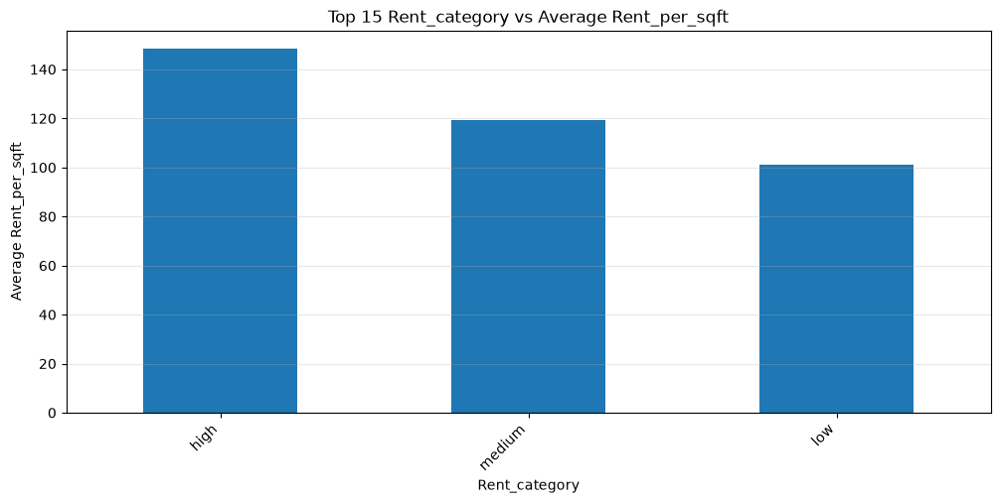

,count,mean,median
Furnishing,,,
furnished,11697,162.754767,147.679325
unfurnished,18604,111.576097,102.918338


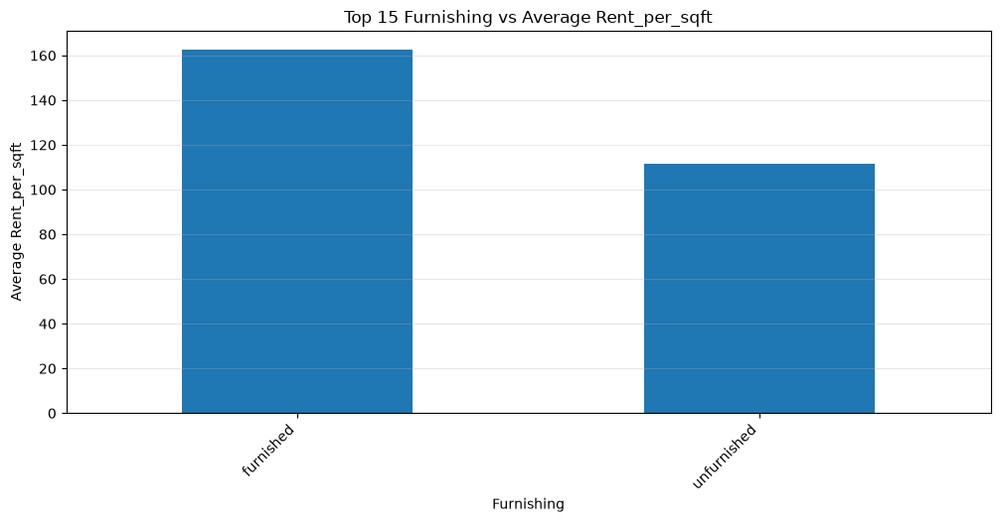

,count,mean,median
Location,,,
bluewaters island,172,328.138715,317.292907
dubai harbour,425,228.021782,219.244823
pearl jumeirah,6,213.039447,216.698399
downtown dubai,2546,198.827777,184.351637
jumeirah islands,67,196.696009,162.880411
palm jumeirah,1420,194.367178,163.659614
za'abeel,397,191.667682,168.290523
jumeirah beach residence (jbr),766,188.161853,141.224807
jumeirah,343,173.723818,163.648265


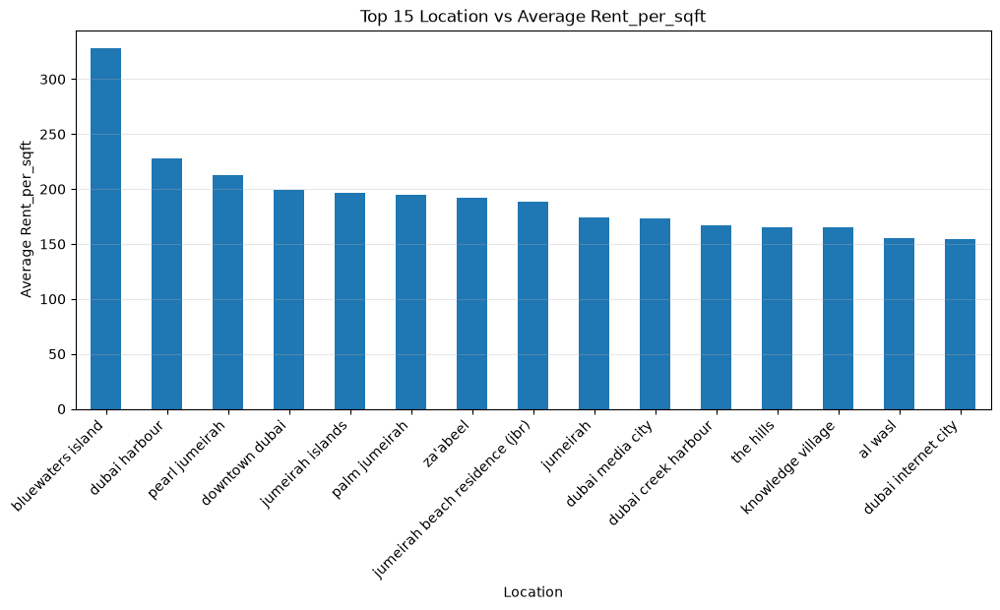

In [30]:
data = X.copy()
data[target] = y

top_n = 15

for col in text_cols:

    summary = (
        data
        .groupby(col)[target]
        .agg(["count", "mean", "median"])
        .sort_values("mean", ascending=False)
    )

    display(summary.head(top_n))

    plt.figure(figsize=(12,5))

    summary["mean"].head(top_n).plot(kind="bar")

    plt.title(f"Top {top_n} {col} vs Average {target}")
    plt.ylabel(f"Average {target}")
    plt.xticks(rotation=45, ha="right")
    plt.grid(axis="y", alpha=0.3)

    plt.show()

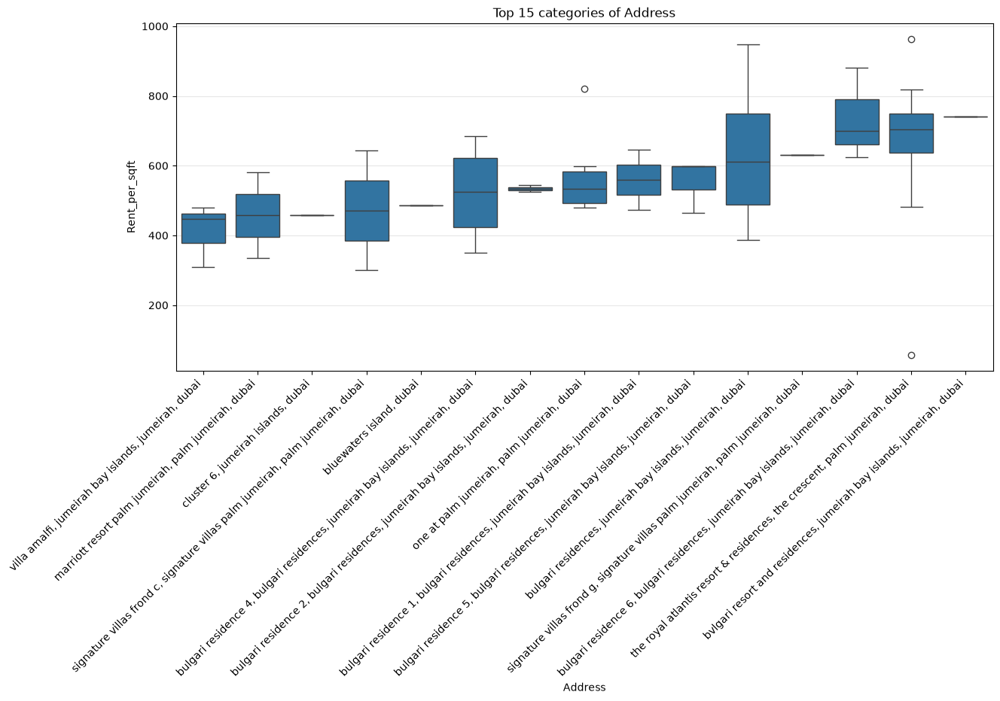

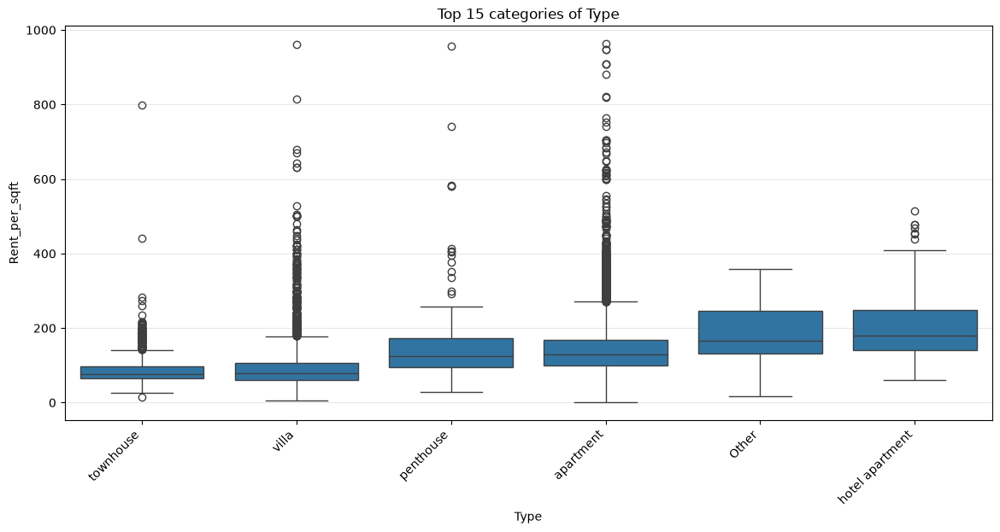

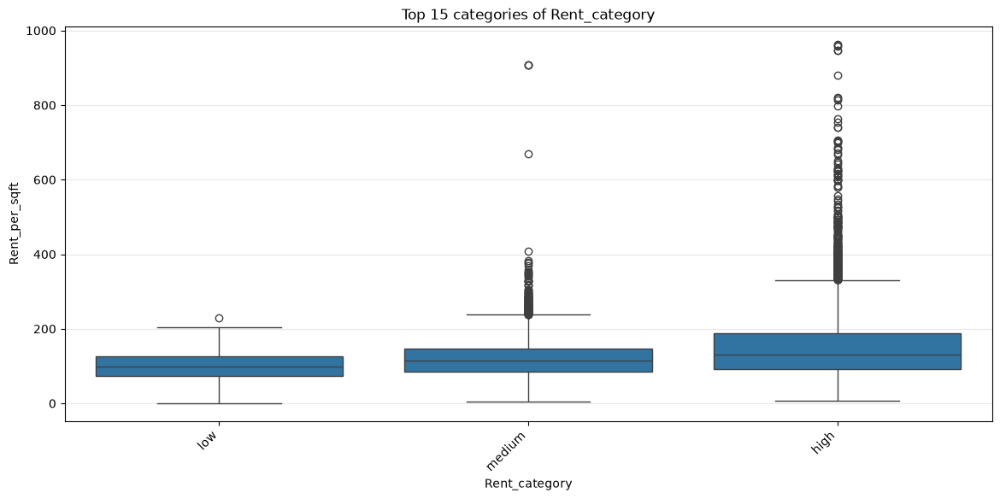

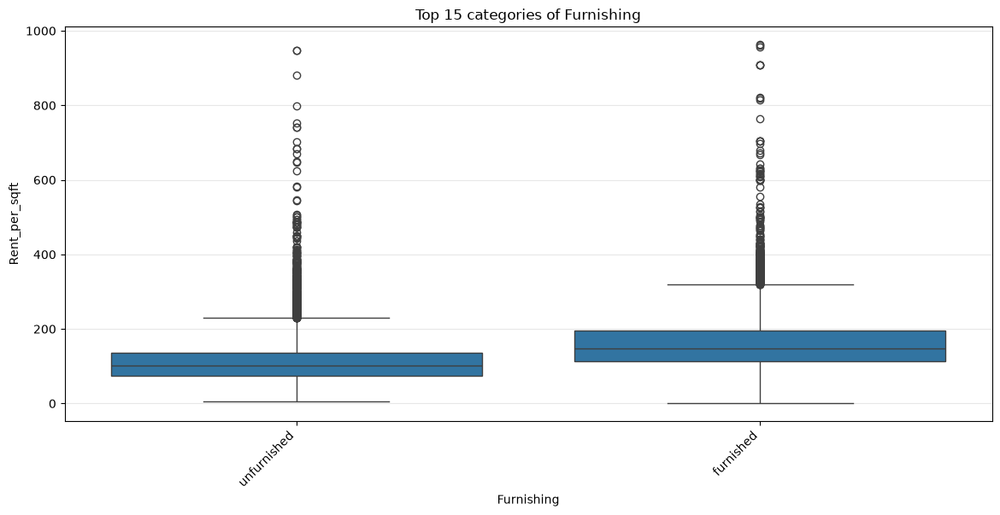

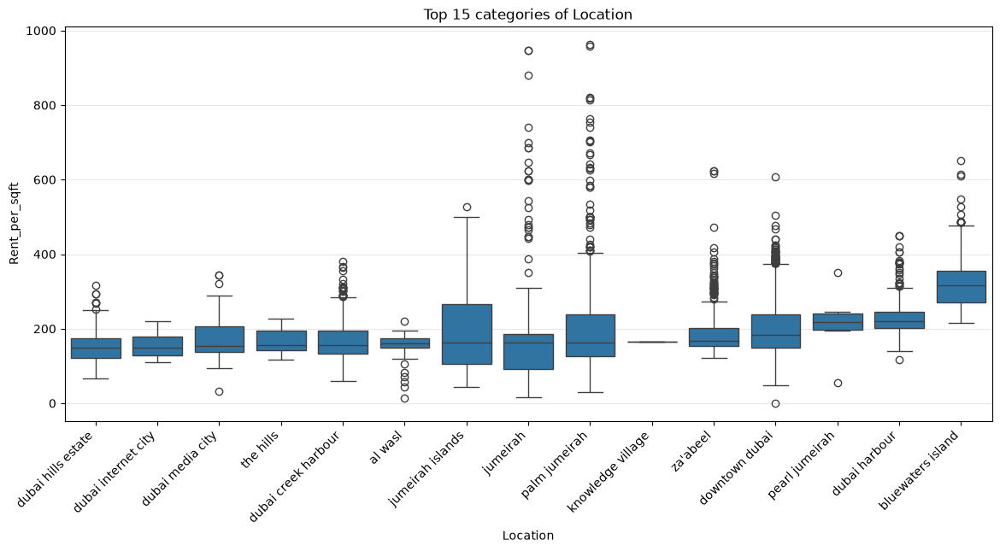

In [31]:
for col in text_cols:

    order = (
        data
        .groupby(col)[target]
        .median()
        .sort_values()
    )

    order = order.tail(top_n).index

    plt.figure(figsize=(14,6))

    sns.boxplot(
        data=data[data[col].isin(order)],
        x=col,
        y=target,
        order=order
    )

    plt.xticks(rotation=45, ha="right")
    plt.title(f"Top {top_n} categories of {col}")
    plt.grid(axis="y", alpha=0.3)

    plt.show()

In [32]:
print(X.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30301 entries, 0 to 30300
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Address                 30301 non-null  object        
 1   Beds                    30301 non-null  int64         
 2   Baths                   30301 non-null  int64         
 3   Type                    30301 non-null  object        
 4   Area_in_sqft            30301 non-null  int64         
 5   Rent_category           30301 non-null  object        
 6   Furnishing              30301 non-null  object        
 7   Posted_date             30301 non-null  datetime64[ns]
 8   Age_of_listing_in_days  30301 non-null  int64         
 9   Location                30301 non-null  object        
 10  Latitude                30301 non-null  float64       
 11  Longitude               30301 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(4), ob

In [33]:
df = dubai_clean.dropna(subset=["Latitude","Longitude","Rent_per_sqft"])

grid_x, grid_y = np.mgrid[
    df["Longitude"].min():df["Longitude"].max():300j,
    df["Latitude"].min():df["Latitude"].max():300j
]

grid_z = griddata(
    (df["Longitude"], df["Latitude"]),
    df["Rent_per_sqft"],
    (grid_x, grid_y),
    method="cubic"
)

fig = go.Figure(
    go.Surface(
        x=grid_x,
        y=grid_y,
        z=grid_z,

        colorscale="RdYlBu_r",   

        colorbar=dict(
            title="Rent_per_sqft"
        )
    )
)

fig.update_layout(
    title="Dubai Rental Price Terrain",

    scene=dict(
        xaxis_title="Longitude",
        yaxis_title="Latitude",
        zaxis_title="Rent_per_sqft",

        camera=dict(
            eye=dict(x=1.7, y=1.7, z=0.8)
        ),

        aspectratio=dict(x=1, y=1, z=0.35)
    ),

    width=1200,
    height=850
)

fig.show()

In [34]:
X = X.drop(columns=["Posted_date","Rent_category"])
num_cols = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
text_cols = X.select_dtypes(include=["object"]).columns.tolist()

### Feature Selection and Data Type Identification

Features that did not provide additional predictive value were removed from the dataset.  
`Posted_date` was excluded because its information was already represented by other features, while `Rent_category` was removed because it is derived from the target variable and does not provide independent information for prediction.  


In [35]:
encoders = {}

for col in text_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))
    encoders[col] = le

### Categorical Feature Encoding

Categorical features were converted into numerical representations using Label Encoding to make them compatible with machine learning algorithms.  
The encoders were stored for each feature to maintain the same mapping and allow consistent transformation of future data.

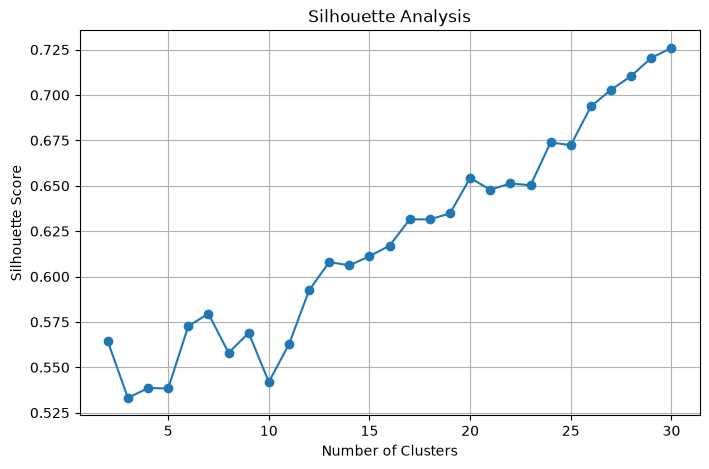

In [36]:
scores = []

for k in range(2, 31):

    model = KMeans(
        n_clusters=k,
        random_state=42,
        n_init="auto"
    )

    labels = model.fit_predict(
        X[["Latitude", "Longitude"]]
    )

    score = silhouette_score(
        X[["Latitude", "Longitude"]],
        labels
    )

    scores.append(score)

plt.figure(figsize=(8,5))
plt.plot(range(2,31), scores, marker="o")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis")
plt.grid(True)
plt.show()

### Optimal Number of Geographic Clusters

Silhouette analysis was performed to evaluate different numbers of clusters (`k`) using the geographic coordinates (Latitude and Longitude).  
The number of clusters was tested within a range of 2 to 30, and the Silhouette Score was calculated for each value to measure cluster quality.  

The value `k=30` was selected as a practical choice because the score showed continuous improvement within the tested range, while avoiding excessive fragmentation of geographic areas. Further increasing the number of clusters may create overly specific regions and reduce the generalization ability of the model.

In [37]:
train_df = X.copy()
train_df["Rent_per_sqft"] = y

# Distance to Dubai Center
dubai_center = (25.2048, 55.2708)

X["Distance_to_center"] = X.apply(
    lambda row: geodesic(
        (row["Latitude"], row["Longitude"]),
        dubai_center
    ).km,
    axis=1
)

# Geographic Clusters
kmeans = KMeans(
    n_clusters=30,
    random_state=42,
    n_init="auto"
)

X["Geo_cluster"] = kmeans.fit_predict(
    X[["Latitude", "Longitude"]]
)


top_locations = (
    train_df
    .groupby("Location")["Rent_per_sqft"]
    .median()
    .sort_values(ascending=False)
    .head(5)
)

weights = top_locations / top_locations.sum()

location_centers = (
    train_df
    .groupby("Location")[["Latitude", "Longitude"]]
    .mean()
)

EARTH_RADIUS = 6371.0

def haversine(lat1, lon1, lat2, lon2):

    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = (
        np.sin(dlat / 2) ** 2
        + np.cos(lat1) * np.cos(lat2)
        * np.sin(dlon / 2) ** 2
    )

    return 2 * EARTH_RADIUS * np.arcsin(np.sqrt(a))

scores = np.zeros(len(X))

for location, weight in weights.items():

    center_lat = location_centers.loc[location, "Latitude"]
    center_lon = location_centers.loc[location, "Longitude"]

    distance = haversine(
        X["Latitude"].values,
        X["Longitude"].values,
        center_lat,
        center_lon
    )

    scores += weight * (1 / (distance + 1))

scores = (scores - scores.min()) / (scores.max() - scores.min())

X["Location_score"] = scores

print(X[["Distance_to_center", "Geo_cluster", "Location_score"]].head())

   Distance_to_center  Geo_cluster  Location_score
0            1.608245           11        0.358647
1            9.059846            1        0.131391
2           18.043374            3        0.833169
3            8.658610           14        0.157768
4           26.238177           13        0.028584


### Geographic Feature Engineering

Geographic features were engineered to capture the impact of location on rental prices.  
The distance from Dubai center was calculated to represent accessibility and centrality.  

K-Means clustering was applied on latitude and longitude coordinates to divide properties into geographic zones, allowing the model to learn regional patterns.  

Additionally, a location score was created based on the proximity to the highest-rent areas. The score combines the median `Rent_per_sqft` of top locations with the distance from each property, giving higher values to properties closer to premium areas.

Correlation Matrix:


,Address,Beds,Baths,Type,Area_in_sqft,Furnishing,Age_of_listing_in_days,Location,Latitude,Longitude,Distance_to_center,Geo_cluster,Location_score,Target
Address,1.000000,0.055185,0.014484,0.096415,0.026011,-0.076883,0.014454,0.146845,-0.080898,-0.079019,0.014222,0.064487,0.045303,0.052576
Beds,0.055185,1.000000,0.314450,0.718596,0.723376,0.232723,0.101304,0.062755,-0.115647,0.018589,0.141427,0.214872,-0.090216,-0.131527
Baths,0.014484,0.314450,1.000000,0.245191,0.238514,0.088362,0.043383,0.032399,-0.045647,-0.003721,0.043681,0.078921,-0.042920,-0.062278
Type,0.096415,0.718596,0.245191,1.000000,0.618505,0.285043,0.047523,0.150252,-0.306760,0.077173,0.274000,0.328785,-0.362228,-0.303463
Area_in_sqft,0.026011,0.723376,0.238514,0.618505,1.000000,0.161718,0.065047,0.022419,-0.050677,0.006953,0.111991,0.221529,-0.111519,-0.177254
Furnishing,-0.076883,0.232723,0.088362,0.285043,0.161718,1.000000,-0.016225,0.096951,-0.060632,0.176478,0.072834,0.180988,-0.276421,-0.365422
Age_of_listing_in_days,0.014454,0.101304,0.043383,0.047523,0.065047,-0.016225,1.000000,-0.005194,0.031654,-0.024644,-0.007397,0.015707,0.065173,0.078139
Location,0.146845,0.062755,0.032399,0.150252,0.022419,0.096951,-0.005194,1.000000,-0.186566,-0.130525,0.138805,0.241277,-0.117530,-0.009689
Latitude,-0.080898,-0.115647,-0.045647,-0.306760,-0.050677,-0.060632,0.031654,-0.186566,1.000000,0.505579,-0.868512,-0.039862,0.314848,0.260725
Longitude,-0.079019,0.018589,-0.003721,0.077173,0.006953,0.176478,-0.024644,-0.130525,0.505579,1.000000,-0.435118,0.041057,-0.395151,-0.189750



Correlation with Target:


Location_score            0.550264
Latitude                  0.260725
Age_of_listing_in_days    0.078139
Address                   0.052576
Location                 -0.009689
Baths                    -0.062278
Beds                     -0.131527
Geo_cluster              -0.176659
Area_in_sqft             -0.177254
Longitude                -0.189750
Distance_to_center       -0.287957
Type                     -0.303463
Furnishing               -0.365422
Name: Target, dtype: float64

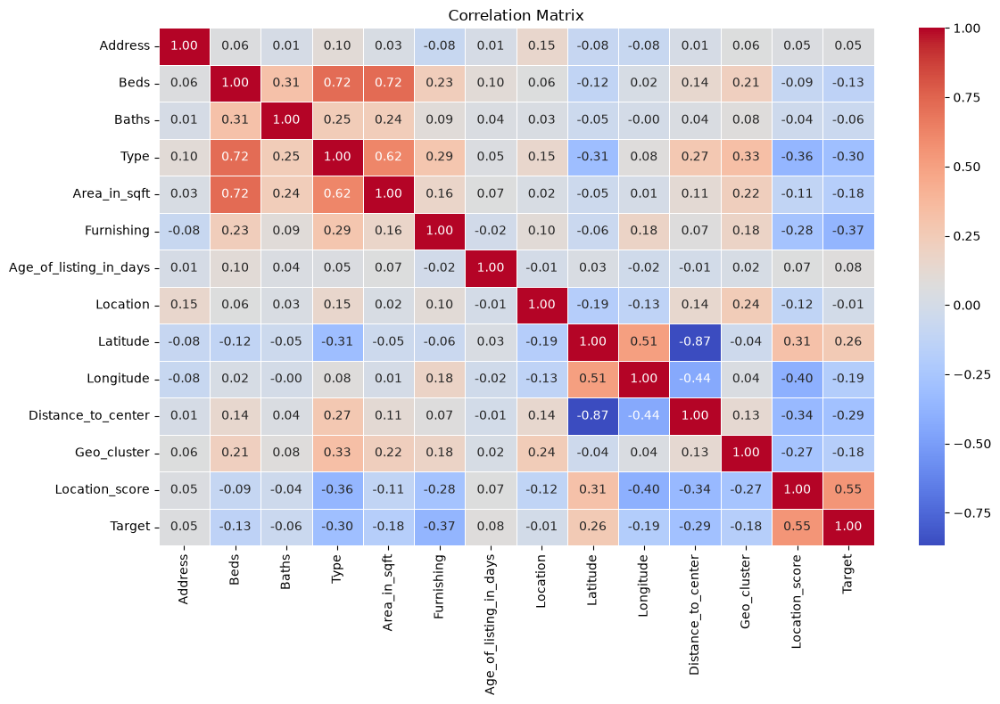


Feature Importance:


Location_score            0.426466
Address                   0.114183
Distance_to_center        0.113868
Area_in_sqft              0.098703
Furnishing                0.085820
Longitude                 0.064516
Latitude                  0.030657
Beds                      0.029368
Location                  0.025069
Type                      0.006447
Geo_cluster               0.002381
Age_of_listing_in_days    0.002044
Baths                     0.000479
dtype: float64

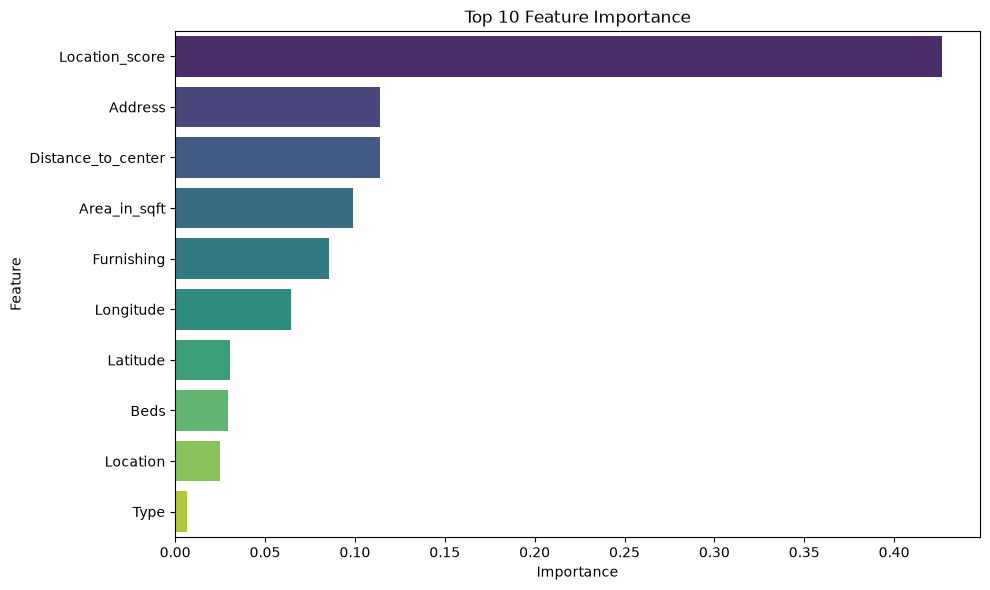


Correlation vs Feature Importance:


,Correlation,Importance
Location_score,0.550264,0.426466
Address,0.052576,0.114183
Distance_to_center,-0.287957,0.113868
Area_in_sqft,-0.177254,0.098703
Furnishing,-0.365422,0.085820
Longitude,-0.189750,0.064516
Latitude,0.260725,0.030657
Beds,-0.131527,0.029368
Location,-0.009689,0.025069
Type,-0.303463,0.006447


In [38]:
data_corr = X.copy()
data_corr["Target"] = y

# Correlation Analysis
correlation_matrix = data_corr.corr(numeric_only=True)

print("Correlation Matrix:")
display(correlation_matrix)

target_corr = (
    correlation_matrix["Target"]
    .drop("Target")
    .sort_values(ascending=False)
)

print("\nCorrelation with Target:")
display(target_corr)


# Correlation Heatmap
plt.figure(figsize=(12, 8))

sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    linewidths=0.5
)

plt.title("Correlation Matrix")
plt.tight_layout()
plt.show()

# Train Gradient Boosting Model
model = GradientBoostingRegressor(
    random_state=100
)

model.fit(X, y)

# Feature Importance
feature_importance = (
    pd.Series(
        model.feature_importances_,
        index=X.columns
    )
    .sort_values(ascending=False)
)

print("\nFeature Importance:")
display(feature_importance)

# Feature Importance Plot
plt.figure(figsize=(10, 6))

sns.barplot(
    x=feature_importance.head(10).values,
    y=feature_importance.head(10).index,
    hue=feature_importance.head(10).index,
    legend=False,
    palette="viridis"
)

plt.title("Top 10 Feature Importance")
plt.xlabel("Importance")
plt.ylabel("Feature")

plt.tight_layout()
plt.show()

# Correlation vs Feature Importance
comparison = pd.concat(
    [
        target_corr.rename("Correlation"),
        feature_importance.rename("Importance")
    ],
    axis=1
).sort_values(
    by="Importance",
    ascending=False
)

print("\nCorrelation vs Feature Importance:")
display(comparison)

In [39]:
print(X.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30301 entries, 0 to 30300
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Address                 30301 non-null  int64  
 1   Beds                    30301 non-null  int64  
 2   Baths                   30301 non-null  int64  
 3   Type                    30301 non-null  int64  
 4   Area_in_sqft            30301 non-null  int64  
 5   Furnishing              30301 non-null  int64  
 6   Age_of_listing_in_days  30301 non-null  int64  
 7   Location                30301 non-null  int64  
 8   Latitude                30301 non-null  float64
 9   Longitude               30301 non-null  float64
 10  Distance_to_center      30301 non-null  float64
 11  Geo_cluster             30301 non-null  int32  
 12  Location_score          30301 non-null  float64
dtypes: float64(4), int32(1), int64(8)
memory usage: 2.9 MB
None


In [41]:
final_df = pd.concat([X, y], axis=1)

final_df.to_csv("final.csv", index=False)
